In [5]:
pip install newsapi

Note: you may need to restart the kernel to use updated packages.


In [10]:
from newsapi import NewsApiClient

# See https://newsapi.org/docs for more information
# on NewsAPI implementation.

API_KEY = 'dce45747b554451c954e329fb966c8e9'

newsapi = NewsApiClient(api_key=API_KEY)
print(newsapi)

In [19]:


import json

#collect all articles that are about machine learning and in the english language
all_articles = newsapi.get_everything(q='Luigi Mangione',
                                      language='en',
                                      sort_by = 'popularity')

#saving articles to a txt file
with open('all_articles.txt', 'w') as file:
    
    #json.dump writes the json data into a readable format
    json.dump(all_articles, file, indent = 4)

# Analyzing News Articles with Frequency Analysis

In [20]:
import json

file = open('all_articles.txt', 'r')
articles = file.read()
data = json.loads(articles)

print('Number of Articles Collected: ' + str(len(data['articles'])) + '\n')

#getting an overview of the articles

for article in data['articles']:
    print(f"Author: {article['author']}")
    print(f"Title: {article['title']}")
    print(f"Description: {article['description']}")
    print(f"Content: {article['content']}")
    print('\n')

Number of Articles Collected: 100

Author: Karissa Bell
Title: Reddit is removing links to Luigi Mangione's manifesto
Description: Reddit is taking down posts linking to the manifesto of the suspected shooter of United Healthcare CEO Brian Thompson. The company says it’s enforcing a longstanding policy, but its actions have angered and frustrated some users.
Luigi Mangione, the 26-year-o…
Content: If you click 'Accept all', we and our partners, including 237 who are part of the IAB Transparency &amp; Consent Framework, will also store and/or access information on a device (in other words, use … [+678 chars]


Author: Matt Burgess, Andy Greenberg, Andrew Couts
Title: Microsoft’s AI Recall Tool Is Still Sucking Up Credit Card and Social Security Numbers
Description: Plus: The US indicts North Koreans in fake IT worker scheme, file-sharing firm Cleo warns customers to patch a vulnerability amid live attacks, and more.
Content: What a week! On Monday, police arrested 26-year-old Luigi Mang

In [5]:
data

{'status': 'ok',
 'totalResults': 5200,
 'articles': [{'source': {'id': None, 'name': 'Yahoo Entertainment'},
   'author': 'Kris Holt',
   'title': "Machine learning pioneers, including the 'Godfather of AI,' are awarded the Nobel Prize in Physics",
   'description': 'Two scientists have been awarded\r\n the Nobel Prize in Physics “for foundational discoveries and inventions that enable machine learning\r\n with artificial neural networks.” John Hopfield, an emeritus professor of Princeton University, devised an associative me…',
   'url': 'https://consent.yahoo.com/v2/collectConsent?sessionId=1_cc-session_6520a371-80be-4f58-afc3-cdc8b7ee93c5',
   'urlToImage': None,
   'publishedAt': '2024-10-08T13:21:24Z',
   'content': "If you click 'Accept all', we and our partners, including 240 who are part of the IAB Transparency &amp; Consent Framework, will also store and/or access information on a device (in other words, use … [+678 chars]"},
  {'source': {'id': None, 'name': '[Removed]'},
  

In [27]:
# titles
import string
from prettytable import PrettyTable

word_bank_title = []

#this loop creates a word bank where a unique instance for each word is added to word_bank
for article in data['articles']:
    
    for word in article['title'].split():
        
        #some processing so that the consistency between word matches is increased
        word = word.lower().strip(string.punctuation + "‘’“”'\"")
        
        if word in word_bank_title and word:
            continue
        else:
            word_bank_title.append(word.lower())
            

            
#added hyphen because I want to keep words like 'machine-learning'
alphabet = 'abcdefghijklmnopqrstuvwxyz-'

#This list comprehension only keeps ther word where each character in the word is part of the alphabet-
word_bank_title = [word for word in word_bank_title if all(char in alphabet for char in word)]


#creating frequency distribution
title_word_count_dict = {}

#loop 1 iterates over all the words gathered in word_bank
for super_word in word_bank_title:
    
    #initialize counter for counting the super_word appearances
    counter = 0
    
    # loop 2 iterates over all the articles in the dataset
    for article in data['articles']:
        
        #superset containts all the words that appear in the articles title, description and content section
        title_words = article['title'].split()
        
        
        #loop 3 iterates over all the words in superset
        for word in title_words:
            
            #strip the word so it can match word_bank
            word = word.lower().strip(string.punctuation + "‘’“”'\"") 
            
            if word == super_word:
                #if word is equal to super_word we want to increment counter
                counter += 1
            else:
                continue
                
    title_word_count_dict[super_word] = counter

sorted_word_count_dict = dict(sorted(title_word_count_dict.items(), key = lambda item: item[1], reverse = True))
    
# Example Table
Table_Title = PrettyTable() # Initialize Table
Table_Title.field_names = ["Word", "Count"] # Declare column names


for t, (word, count) in enumerate(sorted_word_count_dict.items()):
    if t < 30:
        Table_Title.add_row([word, count])
    else:
        break

# Display table
print('Word Frequencies Across Titles')
print(Table_Title)

Word Frequencies Across Titles
+---------+-------+
|   Word  | Count |
+---------+-------+
|   the   |   39  |
|    ai   |   31  |
|    to   |   30  |
|    of   |   22  |
|   and   |   16  |
|    in   |   14  |
|    is   |   14  |
|    a    |   13  |
|   for   |   13  |
|   with  |   12  |
|   your  |   10  |
|  nobel  |   7   |
|  prize  |   6   |
|    it   |   6   |
|   its   |   6   |
|    on   |   6   |
|   new   |   6   |
|   are   |   5   |
| physics |   5   |
|  about  |   5   |
|   more  |   5   |
|    at   |   5   |
|   how   |   5   |
|   from  |   5   |
|    be   |   5   |
| awarded |   4   |
|   this  |   4   |
|   can   |   4   |
|    an   |   4   |
|   but   |   4   |
+---------+-------+


In [28]:
# descriptions
word_bank_descriptions = []

#this loop creates a word bank where a unique instance for each word is added to word_bank
for article in data['articles']:
    
    for word in article['description'].split():
        
        #some processing so that the consistency between word matches is increased
        word = word.lower().strip(string.punctuation + "‘’“”'\"")
        
        if word in word_bank_descriptions and word:
            continue
        else:
            word_bank_descriptions.append(word.lower())
            

#This list comprehension only keeps ther word where each character in the word is part of the alphabet-
word_bank_descriptions = [word for word in word_bank_descriptions if all(char in alphabet for char in word)]


#creating frequency distribution
description_word_count_dict = {}

#loop 1 iterates over all the words gathered in word_bank
for super_word in word_bank_descriptions:
    
    #initialize counter for counting the super_word appearances
    counter = 0
    
    # loop 2 iterates over all the articles in the dataset
    for article in data['articles']:
        
        #superset containts all the words that appear in the articles title, description and content section
        description_words = article['description'].split()
        
        
        #loop 3 iterates over all the words in superset
        for word in description_words:
            
            #strip the word so it can match word_bank
            word = word.lower().strip(string.punctuation + "‘’“”'\"") 
            
            if word == super_word:
                #if word is equal to super_word we want to increment counter
                counter += 1
            else:
                continue
                
    description_word_count_dict[super_word] = counter

sorted_word_count_dict = dict(sorted(description_word_count_dict.items(), key = lambda item: item[1], reverse = True))
    
# Example Table
Table_Descriptions = PrettyTable() # Initialize Table
Table_Descriptions.field_names = ["Word", "Count"] # Declare column names


for t, (word, count) in enumerate(sorted_word_count_dict.items()):
    if t < 30:
        Table_Descriptions.add_row([word, count])
    else:
        break

# Display table
print('Word Frequencies Across Descriptions')
print(Table_Descriptions)

Word Frequencies Across Descriptions
+----------+-------+
|   Word   | Count |
+----------+-------+
|   the    |   92  |
|   and    |   74  |
|    a     |   64  |
|    to    |   63  |
|    of    |   47  |
|    in    |   37  |
|    ai    |   34  |
|   that   |   30  |
|   with   |   29  |
|    is    |   29  |
|   for    |   25  |
|    on    |   20  |
|   new    |   19  |
|   its    |   17  |
|   are    |   15  |
|   has    |   14  |
|  about   |   13  |
|    at    |   13  |
|    or    |   12  |
|   you    |   11  |
|   this   |   11  |
|   from   |   11  |
| machine  |   10  |
| learning |   10  |
|    an    |   10  |
|   but    |   10  |
|   over   |   9   |
|    it    |   9   |
|  prize   |   8   |
|   john   |   8   |
+----------+-------+


In [29]:
# content
word_bank_content = []

#this loop creates a word bank where a unique instance for each word is added to word_bank
for article in data['articles']:
    
    for word in article['content'].split():
        
        #some processing so that the consistency between word matches is increased
        word = word.lower().strip(string.punctuation + "‘’“”'\"")
        
        if word in word_bank_content and word:
            continue
        else:
            word_bank_content.append(word.lower())
            


#scanning for what words at this point have anything other than letters/hyphen
#for word in word_bank_content:
    #for char in word:
        #if char not in alphabet:
            #print(word)
            
#visually I could tell that all of these words were not appropriate

#This list comprehension only keeps ther word where each character in the word is part of the alphabet-
word_bank_content = [word for word in word_bank_content if all(char in alphabet for char in word)]


#creating frequency distribution
content_word_count_dict = {}


#loop 1 iterates over all the words gathered in word_bank
for super_word in word_bank_content:
    
    #initialize counter for counting the super_word appearances
    counter = 0
    
    # loop 2 iterates over all the articles in the dataset
    for article in data['articles']:
        
        #superset containts all the words that appear in the articles title, description and content section
        content_words = article['content'].split()
        
        
        #loop 3 iterates over all the words in superset
        for word in content_words:
            
            #strip the word so it can match word_bank
            word = word.lower().strip(string.punctuation + "‘’“”'\"") 
            
            if word == super_word:
                #if word is equal to super_word we want to increment counter
                counter += 1
            else:
                continue
                
    content_word_count_dict[super_word] = counter
    
sorted_word_count_dict = dict(sorted(content_word_count_dict.items(), key = lambda item: item[1], reverse = True))

# Example Table
content_table = PrettyTable() # Initialize Table
content_table.field_names = ["Word", "Count"] # Declare column names


for t, (word, count) in enumerate(sorted_word_count_dict.items()):
    if t < 30:
        content_table.add_row([word, count])
    else:
        break

# Display table
print('Word Frequencies Across Content')
print(content_table)

Word Frequencies Across Content
+-------------+-------+
|     Word    | Count |
+-------------+-------+
|     the     |  126  |
|    chars    |   99  |
|      a      |   92  |
|     and     |   90  |
|      of     |   79  |
|      to     |   76  |
|      in     |   54  |
|     for     |   43  |
|      ai     |   37  |
|      on     |   33  |
|     that    |   33  |
|      is     |   33  |
|     with    |   25  |
|     its     |   23  |
|     more    |   23  |
|     our     |   22  |
|     you     |   21  |
|      at     |   17  |
|   updates   |   17  |
|    daily    |   17  |
|      it     |   16  |
|   content   |   16  |
|    latest   |   16  |
|     are     |   15  |
|     this    |   15  |
|     new     |   14  |
|     has     |   14  |
|     join    |   14  |
|    weekly   |   14  |
| newsletters |   14  |
+-------------+-------+


In [30]:
#Since the API call made sure to sort by popularity, the top ten results are articles written by the most popular Source/Author
pop_table = PrettyTable()

pop_table.field_names = ['Rank', 'Author', 'Source']

for i in range(10):
    pop_table.add_row([i+1, data['articles'][i]['author'], data['articles'][i]['source']['name']])
    
    
print(pop_table)


+------+-------------------+---------------------+
| Rank |       Author      |        Source       |
+------+-------------------+---------------------+
|  1   |     Kris Holt     | Yahoo Entertainment |
|  2   |        None       |      [Removed]      |
|  3   |   Daniel Cooper   | Yahoo Entertainment |
|  4   | Devindra Hardawar | Yahoo Entertainment |
|  5   |   Boone Ashworth  |        Wired        |
|  6   |    Lauren Goode   |        Wired        |
|  7   |  Jess Weatherbed  |      The Verge      |
|  8   |  Abigail Bassett  |      The Verge      |
|  9   |   Todd Feathers   |     Gizmodo.com     |
|  10  |    Joe Tilleli    |     Gizmodo.com     |
+------+-------------------+---------------------+


# lexical diversity in descriptions and contents

In [31]:
# Your code starts here
#   Please add comments or text cells in between to explain the general idea of each block of the code.
#   Please feel free to add more cells below this cell if necessary

def lexical_diversity(tokens):
    return 1.0 * (len(set(tokens))/len(tokens))

source1 = 'Yahoo Entertainment'
source2 = 'Wired'

source1_arts = []
source2_arts = []

for article in data['articles']:
    if article['source']['name'] == source1:
        source1_arts.append(article)
    elif article['source']['name'] == source2:
        source2_arts.append(article)
    else:
        continue


for i, article in enumerate(source1_arts):
    print(f'Yahoo {i+1}: ' + str(lexical_diversity(article['description'])))

print('\n')
    
for i, article in enumerate(source2_arts):
    print(f'Wired {i+1}: ' + str(lexical_diversity(article['description'])))
    

Yahoo 1: 0.1423076923076923
Yahoo 2: 0.1346153846153846
Yahoo 3: 0.1576923076923077


Wired 1: 0.23728813559322035
Wired 2: 0.25210084033613445


For the comparison between the two most popular sources regarding machine learning, Yahoo and Wired, it appears that Wired has a greater lexical diversity. This means that the Wired articles had a larger number of unique words, indicating a text that was richer in vocabulary compared to the Yahoo articles.



# Image processing


In [32]:
#   Please add comments or text cells in between to explain the general idea of each block of the code.
#   Please feel free to add more cells below this cell if necessary
from IPython.display import Image
image_urls = []


for article in data['articles']:
    Iurl = article['urlToImage']
    image_urls.append(Iurl)
    try:
        image = Image(url = Iurl)
        print(article['title'])
        display(image)
    except ValueError:
        print('No Image')



No Image
No Image
No Image
No Image
This Talking Pet Collar Is Like a Chatbot for Your Dog


Google’s Visual Search Can Now Answer Even More Complex Questions


Meta brings back face scanning to combat scams and account hacking


Honda Zero first drive: an EV without the baggage


US Treasury Says AI Tools Prevented $1 Billion of Fraud in 2024


Bring the Apple iPad Mini into Your Hands at a Lowest Price for Prime Day


Three-Star System Shatters Astronomy Record


Tom Holland Loves the Latest Draft of Spider-Man 4 but Explains the Struggle to Make It


Google's Pixel 10 and 11 could push its chip and hardware to bolster its cameras


Google Messages now has smarter detection to tackle tricky scam messages


Fitbit Labs is here with an 'Insight Explorer' test thanks to Google's Gemini


Android adds 3 anti-theft security features to your phone, with more on the way


Snapdragon 8 Elite explained: Custom CPU cores, huge GPU upgrades, and so much more


M3 vs. M4 Chip Buyer's Guide: How Much Better Really Is M4?


18 New Things Your iPhone Can Do in iOS 18.1


Android 16 Will Launch Earlier Than Usual. Google's Android VP Explains Why


5 Easy Tips for Removing Stubborn Coffee Stains From Your Mugs


The Easiest Methods to Remove Stubborn Coffee Stains From Your Mugs


What Is Midjourney? Everything to Know About the AI Image Generator


Is AI the Answer to Your Money Problems? Here's What It Can (and Can't) Do


iPad Mini 7 With Apple Intelligence Available Today for Same-Day Pickup


Nobel Prize in chemistry awarded to scientists for work on proteins


Arkansas May Have Vast Lithium Reserves, Researchers Say


Hobbyist Builds a Modern System That Still Runs MS-DOS


US Military Makes First Confirmed OpenAI Purchase For War-Fighting Forces


Geoffrey Hinton, the 'godfather of AI' who warned of its existential risk, awarded Nobel Prize for Physics


Get ready to see AirPods at concerts


Over 90% of AWS's biggest data center customers are now using its homegrown Graviton chips, executive says


Anthropic's power players: Here are the 11 leaders helping shape the future of the Amazon-backed AI company


One of Amazon's top AI executives is out


Inshur provides embedded insurance to ride-hailing companies like Uber. Check out the 16-slide pitch deck used to secure $19 million.


The head of Cubist's centralized high-speed trading unit is out after less than a year


Google Research execs reveal how they use AI in their daily lives — and where they think twice about it


I almost dropped out of high school and went from community college to a six-figure job at a tech company


Inside Amazon's nuclear ambitions, its 'Piano Man' project, and CEO Andy Jassy's support


Chip giant TSMC reports blockbuster results even as questions over AI mania loom


Parents sue the school that punished their son for using AI, saying it could ruin his college prospects


A payments startup hoping to take on Stripe and Square just raised $75 million with this pitch deck


Insider Today: Millennial money mistake


That old Photobucket account you haven't touched in years could soon be licensed to train AI


Boeing's turnaround plan is something any business can relate to: focus on the culture and the work


Boomers had Jobs. Millennials had Zuck. Where are Gen Z's tech founders?


What Business Leaders Need to Know About Supply Chain Management - SPONSOR CONTENT FROM SCHNEIDER ELECTRIC


Liftoff launches Cortex, a machine-learning model that improves mobile ads


Dotmatics aims to speed drug development, break data silos with Geneious Luma


AI pioneer Geoffrey Hinton, who warned of X-risk, wins Nobel Prize in Physics


LinkedIn upgrades its Recruiter with an AI Hiring Assistant


The ‘strawberrry’ problem: How to overcome AI’s limitations


Nvidia makes 7 tech announcements in Washington D.C. as antitrust looms


CalmiGo’s new handheld device helps stop your panic attacks


SAP adds more open source LLM support, turns Joule into a collaborative agent


Pika 1.5 updates again to add even more AI video Pikaffects: crumble, dissolve, deflate, ta-da


Small but mighty: H2O.ai’s new AI models challenge tech giants in document analysis


Cohere launches new AI models to bridge global language divide


AI wins another Nobel, this time in Chemistry: Google DeepMinders Hassabis and Jumper awarded for AlphaFold


Third Dimension AI raises $6.9M to build game worlds with generative AI


Generative AI grows 17% in 2024, but data quality plummets: Key findings from Appen’s State of AI Report


PlayVS partners with Omnic to help gamers play smarter with AI feedback


A VIC-20 with no VIC


Claude AI Gets Bored During Coding Demonstration, Starts Perusing Photos of National Parks Instead


Sissy Squats: The Secret Weapon for Leg Strength and Mobility


How Meteorologists Are Using AI to Forecast Hurricane Milton and Other Storms


The Surprising Health Benefits of Pain


Why You Might Soon Be Paid Like an Uber Driver—Even If You’re Not One


The Critical Role cast explores big wins and hard decisions on Vox Machina season 3


Deadpool & Wolverine, Speak No Evil, Netflix’s The Platform 2, and every movie new to streaming this week


The creepy yet helpful humanoid robot ready to move into your home


Chinese humanoid robot could be the future of affordable in-home care


The Economic Philosophy of Donald Harris


9 Best AI Marketing Bots I Use at Work in 2024


Call of Duty: Black Ops 6 Preseason Patch Notes Released Amid Global Release Date Rollout


Millions in the U.S. May Be Drinking Groundwater Tainted With ‘Forever Chemicals’


The death of Moore’s Law is finally starting to stink


No, generative AI isn’t taking over your PC games anytime soon


Apple iPhone 16 Plus vs. iPhone 14 Plus: Is it upgrade time?


A Nobel Prize for Artificial Intelligence


Just Be Anxious About the Election


ChatGPT vs the Honor Code


'It's scary - but so's giving birth': The female unit gunning down Russian drones


Machine Learning to Computational Plasma Physics Reduced-Order Plasma Modeling


AI Winter Is Coming


Understanding Gaussians


Nobel Prize goes to John Hopfield and Geoffrey Hinton work on machine learning


They trained artificial neural networks using physics


It all started with a perceptron


Accountability Sinks


How the New Raspberry Pi AI Hat Supercharges LLMs at the Edge


Initial CUDA Performance Lessons


Gödel Agent: A Self-Referential Agent Framework for Recursive Self-Improvement


The real data wall is billions of years of evolution


RebrickNet – Lego Part Detector


Booting Sun Sparc Servers


Employers Say Students Need AI Skills. What If Students Don't Want Them?


The Unnecessary Decline of U.S. Numerical Weather Prediction


NanoGPT (124M) quality in 3.25B training tokens (vs. 10B)


The Open Source AI Definition RC1 Is Available for Comments


In [33]:
print(image_urls[0])

None


Based on these images we can tell that it isn't always directly clear how they relate to the topic of machine learning. The first image with the dog for example doesn't seem to relate to machine learning at all, however when we add the title for context we can see the relation: The collar functions as a chatbot for the dog. For an analysis of the images it is therefore important to add context to these images so that we can see how the images relate to the topic at hand. Without this context the images would reveal very little about what the article is truly about.

In [34]:
import torch

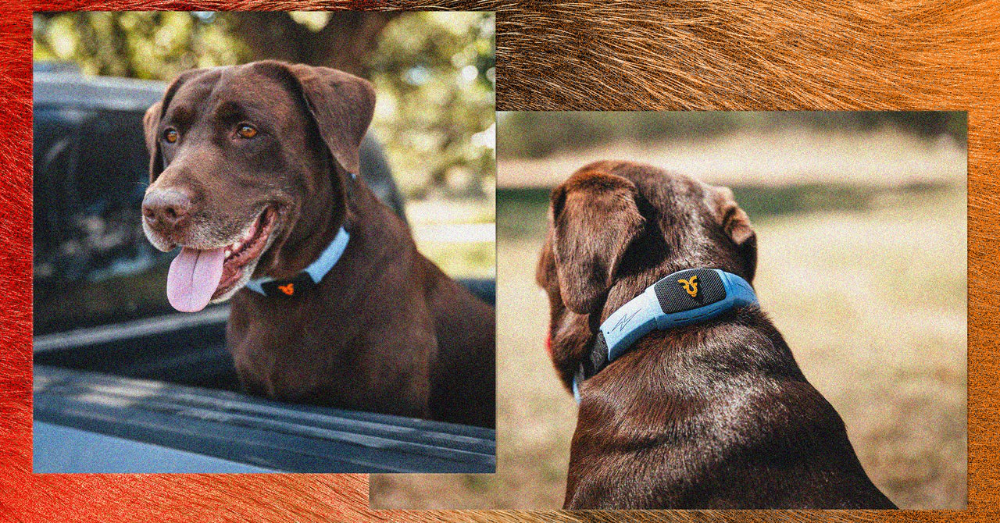

In [35]:
from transformers import pipeline
import requests
from PIL import Image, ImageDraw

cleaned_urls = [url for url in image_urls if isinstance(url, str)]
url1 = cleaned_urls[0]

image = Image.open(requests.get(url1, stream = True).raw)
display(image)

In [36]:
print(torch.__version__)

1.11.0


In [37]:
obj_detector = pipeline(task = 'object-detection')

No model was supplied, defaulted to facebook/detr-resnet-50 and revision 1d5f47b (https://huggingface.co/facebook/detr-resnet-50).
Using a pipeline without specifying a model name and revision in production is not recommended.
Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a 

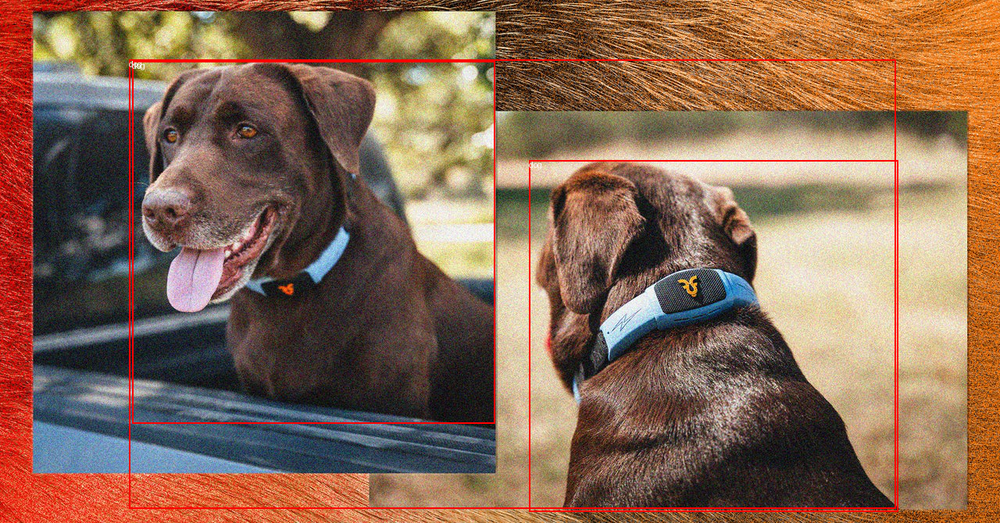

In [38]:
results = obj_detector(image)

draw = ImageDraw.Draw(image)

for result in results:
    score, label, box = result['score'], result['label'], result['box']
    x, y, x2, y2 = box['xmin'], box['ymin'], box['xmax'], box['ymax'],
    draw.rectangle((x, y, x2, y2), outline = 'red', width = 2)
    draw.text((x, y), label, fill='white')

image

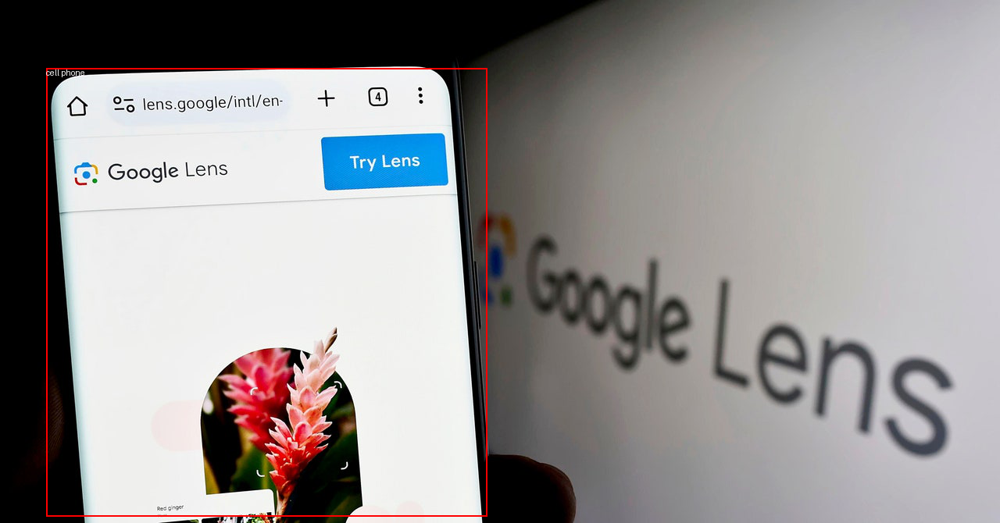

In [39]:
url2 = cleaned_urls[1]

image = Image.open(requests.get(url2, stream = True).raw)

results = obj_detector(image)

draw = ImageDraw.Draw(image)

for result in results:
    score, label, box = result['score'], result['label'], result['box']
    x, y, x2, y2 = box['xmin'], box['ymin'], box['xmax'], box['ymax'],
    draw.rectangle((x, y, x2, y2), outline = 'red', width = 2)
    draw.text((x, y), label, fill='white')

image

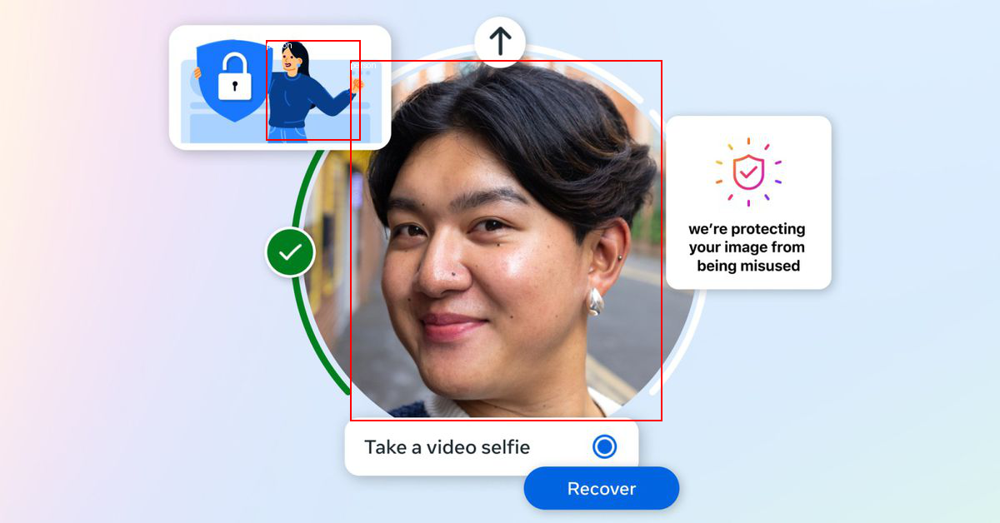

In [40]:
url3 = cleaned_urls[2]

image = Image.open(requests.get(url3, stream = True).raw)

results = obj_detector(image)

draw = ImageDraw.Draw(image)

for result in results:
    score, label, box = result['score'], result['label'], result['box']
    x, y, x2, y2 = box['xmin'], box['ymin'], box['xmax'], box['ymax'],
    draw.rectangle((x, y, x2, y2), outline = 'red', width = 2)
    draw.text((x, y), label, fill='white')

image

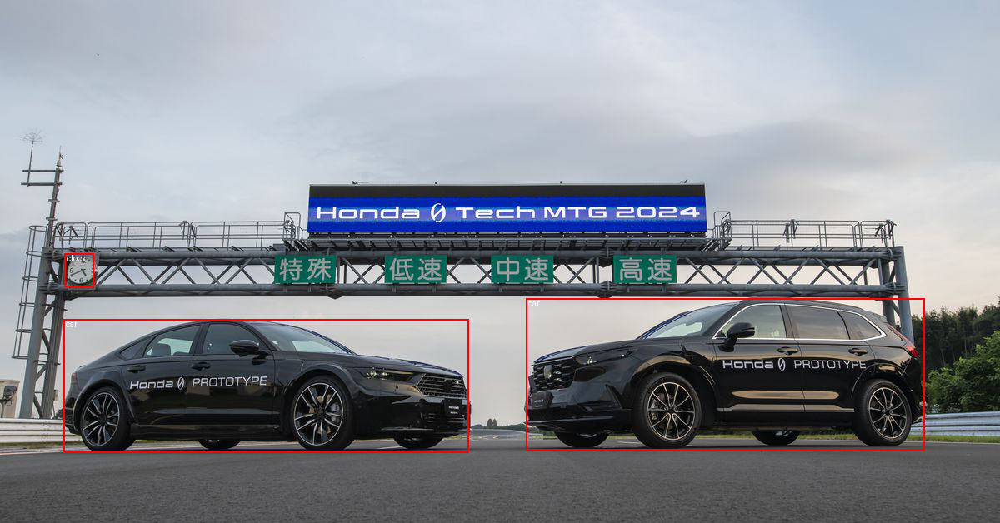

In [41]:
url4 = cleaned_urls[3]

image = Image.open(requests.get(url4, stream = True).raw)

results = obj_detector(image)

draw = ImageDraw.Draw(image)

for result in results:
    score, label, box = result['score'], result['label'], result['box']
    x, y, x2, y2 = box['xmin'], box['ymin'], box['xmax'], box['ymax'],
    draw.rectangle((x, y, x2, y2), outline = 'red', width = 2)
    draw.text((x+3, y), label, fill='white')

image

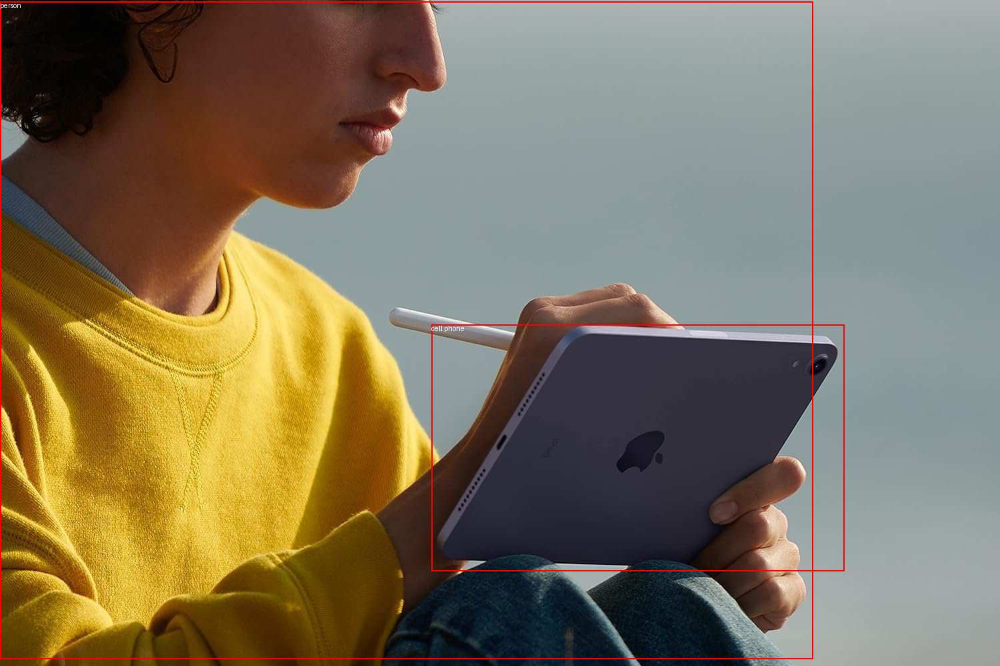

In [42]:
url5 = cleaned_urls[5]

image = Image.open(requests.get(url5, stream = True).raw)

results = obj_detector(image)

draw = ImageDraw.Draw(image)

for result in results:
    score, label, box = result['score'], result['label'], result['box']
    x, y, x2, y2 = box['xmin'], box['ymin'], box['xmax'], box['ymax'],
    draw.rectangle((x, y, x2, y2), outline = 'red', width = 2)
    draw.text((x, y), label, fill='white')

image